# Segmentation of Tembawang Regions
This notebook segments images (e.g., aerial or satellite images) to identify tembawang-related areas.

It uses pre-trained models and image processing techniques to detect and mask regions of interest, producing annotated outputs.

## Main Functions:
- Load input images (e.g., GeoTIFFs or satellite screenshots)
- Apply segmentation models (e.g., Segment Anything Model - SAM)
- Save and visualize the segmented outputs

## Requirements:
- opencv-python
- numpy
- segment-anything
- PIL (Pillow)
- rasterio
- matplotlib
- shapely
- geopandas

## Notes:
- The input images must have appropriate metadata (e.g., georeferencing) for accurate overlays.
- Outputs can include GeoJSON files, segmentation masks, and visualization plots.


In [3]:
pip install git+https://github.com/facebookresearch/segment-anything.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /private/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/pip-req-build-d5a7j84m
  Running command git clone --quiet https://github.com/facebookresearch/segment-anything.git /private/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/pip-req-build-d5a7j84m
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36587 sha256=fe44a682140d11f7ce2fb3ca6d54601d388dea6b58444e6e5b8b7c5fc406e8f6
  Stored in directory: /private/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/pip-ephem-wheel-cache-87flgc45/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment-anything
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install opencv-python matplotlib torch torchvision

Note: you may need to restart the kernel to use updated packages.


/Users/henryhong/anaconda3/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


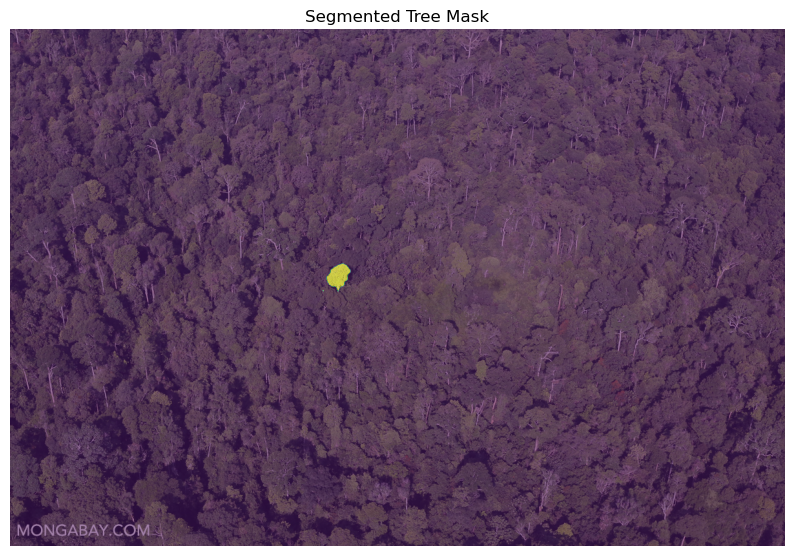

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor

# Load your image
image = cv2.imread("trees.jpg")  # your uploaded image
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Load the SAM model
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to(device="cpu")  # or "cuda" if you have a GPU

predictor = SamPredictor(sam)
predictor.set_image(image) 

# Pick a point (x, y) to prompt segmentation
input_point = np.array([[500, 400]])  # try different points on tree crowns
input_label = np.array([1])

# Run SAM
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True
)

# Visualize result
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.imshow(masks[0], alpha=0.5)
plt.title("Segmented Tree Mask")
plt.axis("off")
plt.show()


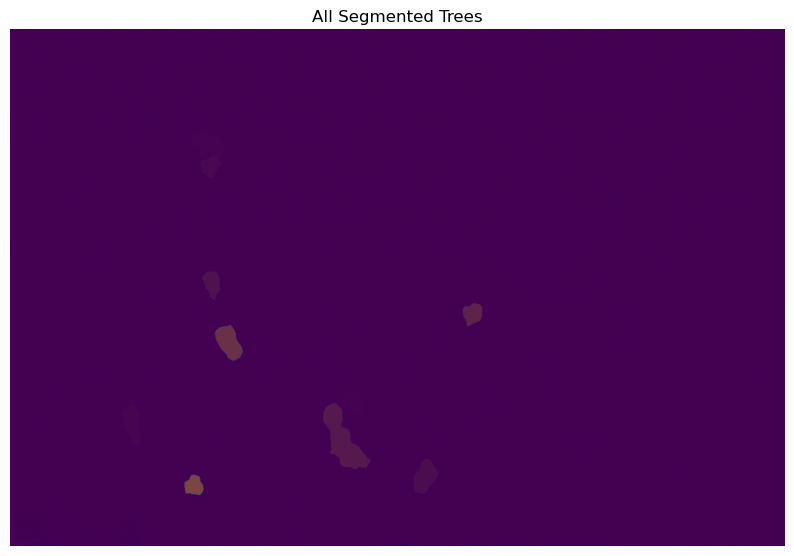

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

# Load your image
image = cv2.imread("trees.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Load SAM model
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to(device="cpu")  # or "cuda" if available

# Initialize automatic mask generator
mask_generator = SamAutomaticMaskGenerator(sam)

# Generate masks
masks = mask_generator.generate(image)

# Visualize all masks
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    plt.imshow(mask["segmentation"], alpha=0.3)  # 0.3 = mask transparency
plt.title("All Segmented Trees")
plt.axis("off")
plt.show()


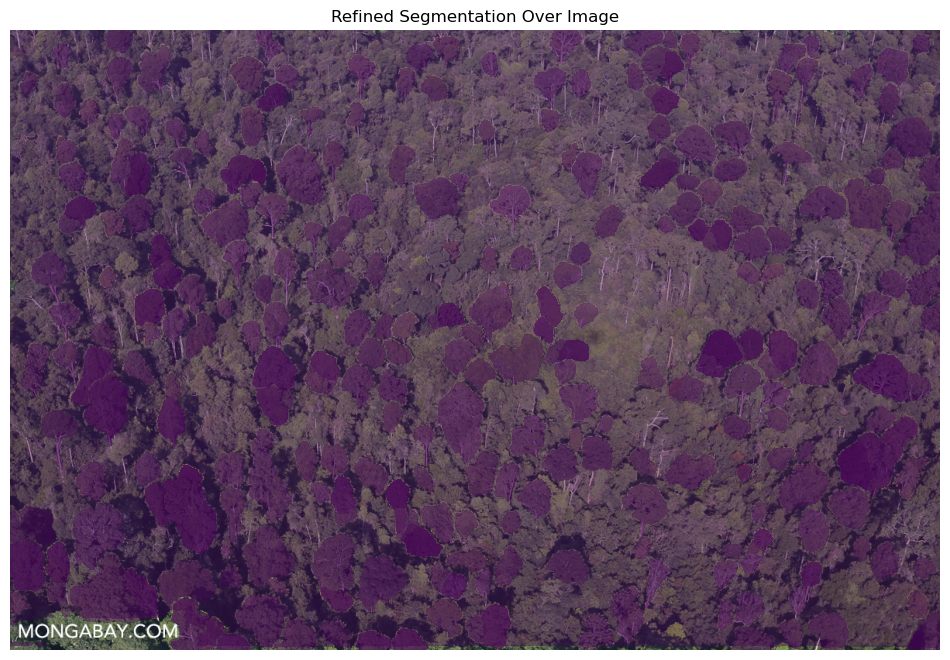

In [16]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=64,         # higher = finer grid
    pred_iou_thresh=0.88,       # confidence filter
    stability_score_thresh=0.92, # stability of mask
    min_mask_region_area=100,    # filter out tiny masks
)

fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(image)

for i, m in enumerate(masks):
    mask = m['segmentation']
    ax.imshow(np.ma.masked_where(mask == False, mask), alpha=0.4)

ax.set_title("Refined Segmentation Over Image")
ax.axis("off")
plt.show()


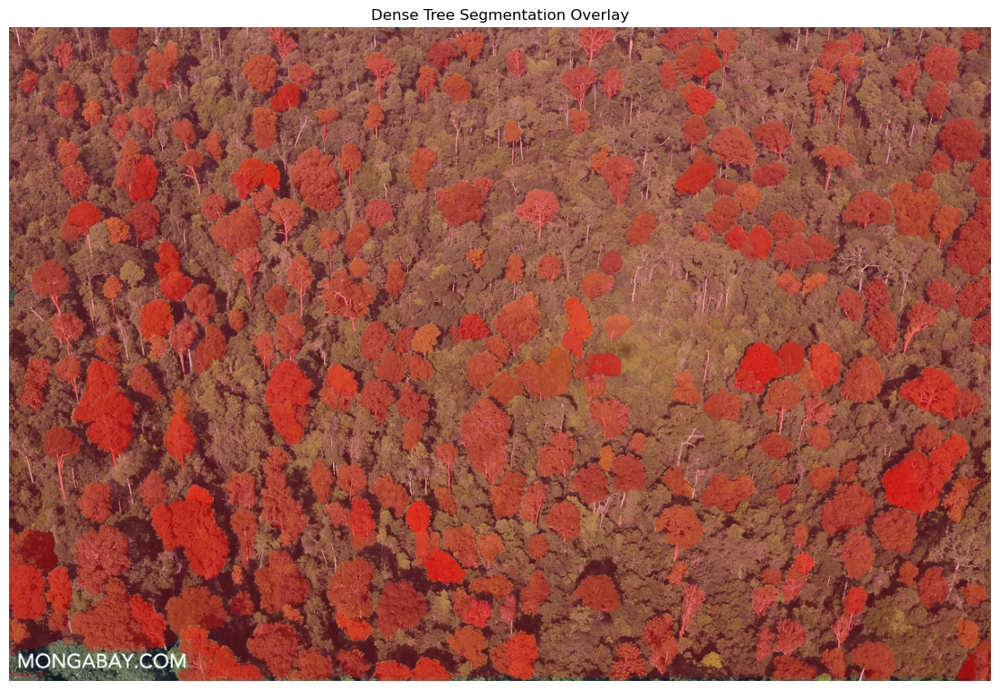

In [17]:
from segment_anything import SamAutomaticMaskGenerator

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=128,              # higher = finer segmentation grid
    pred_iou_thresh=0.86,             # slightly looser to catch more detail
    stability_score_thresh=0.9,       # still avoid unstable outlines
    crop_n_layers=1,                  # enable image cropping for higher resolution
    crop_n_points_downscale_factor=2,# allow more points per crop
    min_mask_region_area=50           # allow small blobs (tiny trees)
)

fig, ax = plt.subplots(figsize=(14, 14))
ax.imshow(image)

for m in masks:
    mask = m['segmentation']
    ax.imshow(np.ma.masked_where(mask == False, mask), alpha=0.25, cmap="autumn")

ax.set_title("Dense Tree Segmentation Overlay")
ax.axis("off")
plt.show()

In [20]:
from segment_anything import SamAutomaticMaskGenerator
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=256,                  # dense point grid
    pred_iou_thresh=0.84,                 # allow more candidate masks
    stability_score_thresh=0.85,          # slightly relaxed for complex shapes
    crop_n_layers=2,                      # multi-scale cropping for higher fidelity
    crop_n_points_downscale_factor=1,     # retain high point density in crops
    min_mask_region_area=15               # allow *tiny* trees
)

# Optional: Enhance image contrast before segmenting
image = cv2.imread("trees.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# CLAHE to enhance local contrast
lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl = clahe.apply(l)
limg = cv2.merge((cl, a, b))
image = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/ipykernel_62440/3255191631.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap("plasma", len(masks))  # N unique colors


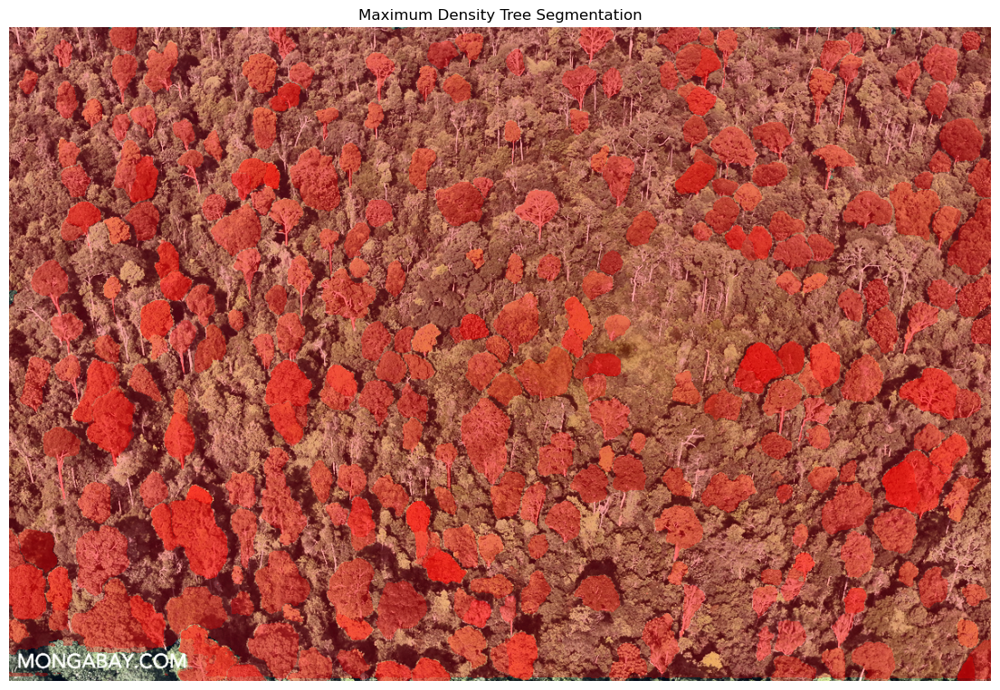

In [23]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

fig, ax = plt.subplots(figsize=(14, 14))
ax.imshow(image)

colors = cm.get_cmap("plasma", len(masks))  # N unique colors

for i, m in enumerate(masks):
    masked = np.ma.masked_where(m["segmentation"] == False, m["segmentation"])
    ax.imshow(masked, alpha=0.3, cmap="autumn")  # uniform gray fill
    ax.contour(masked, levels=[0.5], colors=[colors(i)], linewidths=1)  # colored edge

ax.set_title("Maximum Density Tree Segmentation")
ax.axis("off")
plt.show()


/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/ipykernel_62440/1315964964.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap("plasma", len(masks))  # N unique colors


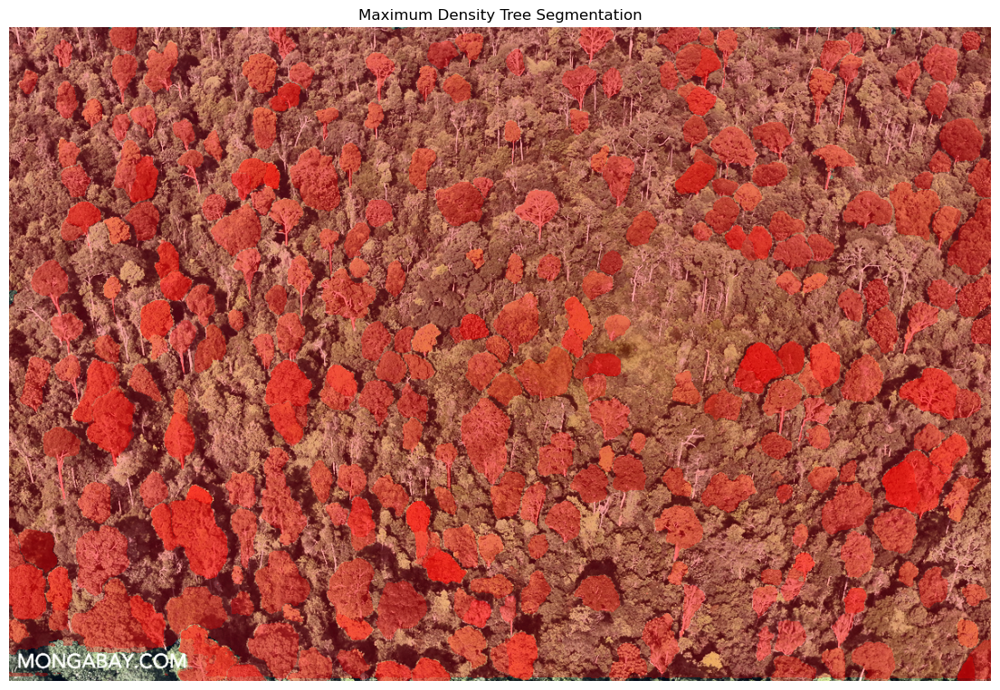

In [ ]:
from segment_anything import SamAutomaticMaskGenerator
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=1024,                  # dense point grid
    pred_iou_thresh=0.6,                 # allow more candidate masks
    stability_score_thresh=0.85,          # slightly relaxed for complex shapes
    crop_n_layers=2,                      # multi-scale cropping for higher fidelity
    crop_n_points_downscale_factor=1,     # retain high point density in crops
    min_mask_region_area=10              # allow *tiny* trees
)

fig, ax = plt.subplots(figsize=(14, 14))
ax.imshow(image)

colors = cm.get_cmap("plasma", len(masks))  # N unique colors

for i, m in enumerate(masks):
    masked = np.ma.masked_where(m["segmentation"] == False, m["segmentation"])
    ax.imshow(masked, alpha=0.3, cmap="autumn")  # uniform gray fill
    ax.contour(masked, levels=[0.5], colors=[colors(i)], linewidths=1)  # colored edge

ax.set_title("Maximum Density Tree Segmentation")
ax.axis("off")
plt.show()


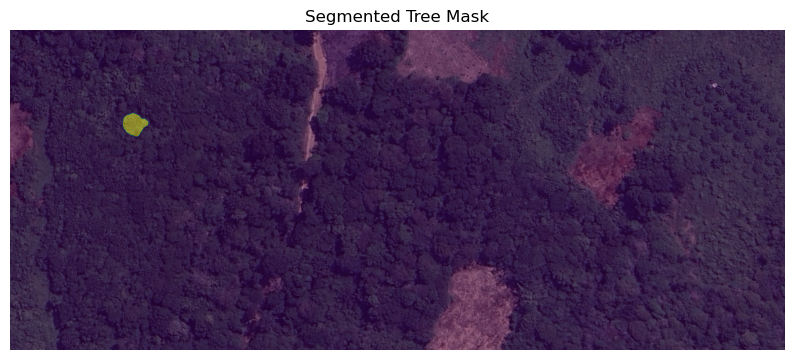

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor

# Load your image
image = cv2.imread("tembawang.png")  # your uploaded image
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Load the SAM model
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to(device="cpu")  # or "cuda" if you have a GPU

predictor = SamPredictor(sam)
predictor.set_image(image)

# Pick a point (x, y) to prompt segmentation
input_point = np.array([[500, 400]])  # try different points on tree crowns
input_label = np.array([1])

# Run SAM
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True
)

# Visualize result
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.imshow(masks[0], alpha=0.5)
plt.title("Segmented Tree Mask")
plt.axis("off")
plt.show()


In [7]:
from segment_anything import SamAutomaticMaskGenerator
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=256,                  # dense point grid
    pred_iou_thresh=0.84,                 # allow more candidate masks
    stability_score_thresh=0.85,          # slightly relaxed for complex shapes
    crop_n_layers=2,                      # multi-scale cropping for higher fidelity
    crop_n_points_downscale_factor=1,     # retain high point density in crops
    min_mask_region_area=15               # allow *tiny* trees
)

# Optional: Enhance image contrast before segmenting
image = cv2.imread("tembawang.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# CLAHE to enhance local contrast
lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl = clahe.apply(l)
limg = cv2.merge((cl, a, b))
image = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)

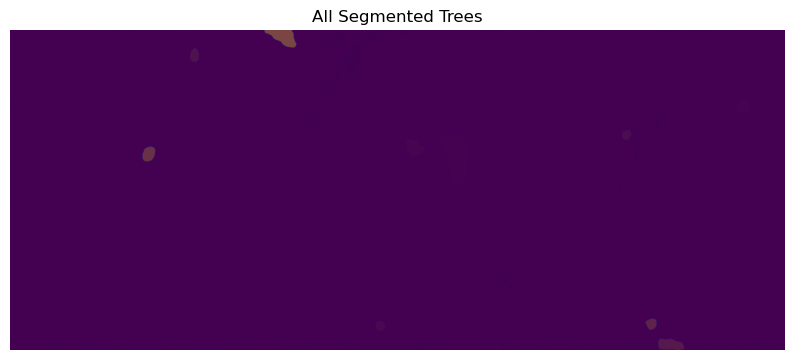

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

# Load your image
image = cv2.imread("tembawang.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Load SAM model
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to(device="cpu")  # or "cuda" if available

# Initialize automatic mask generator
mask_generator = SamAutomaticMaskGenerator(sam)

# Generate masks
masks = mask_generator.generate(image)

# Visualize all masks
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    plt.imshow(mask["segmentation"], alpha=0.3)  # 0.3 = mask transparency
plt.title("All Segmented Trees")
plt.axis("off")
plt.show()


/Users/henryhong/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/var/folders/bl/r4lpmbn54j5d3lnqmf8y9gnw0000gn/T/ipykernel_73782/2642370578.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap("plasma", len(masks))


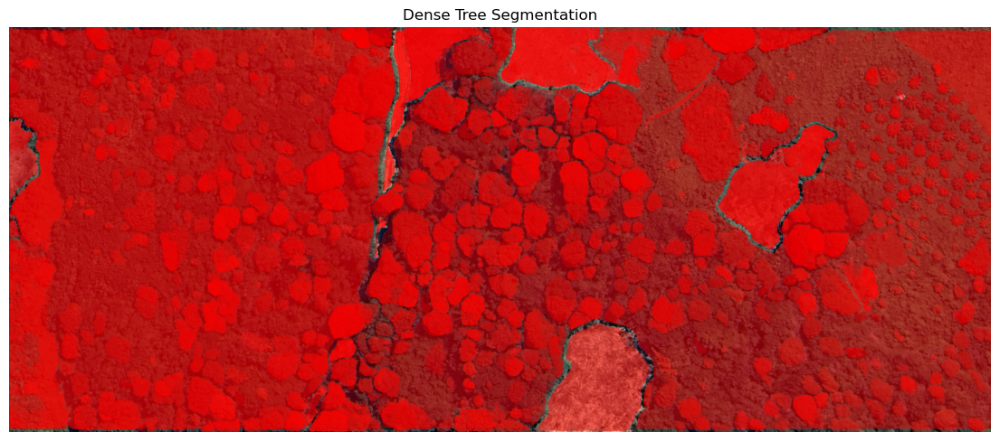

Example polygon coordinates:
[(159.0, 240.0), (158.0, 241.0), (156.0, 241.0), (155.0, 242.0), (155.0, 243.0), (154.0, 244.0), (154.0, 252.0), (155.0, 253.0), (155.0, 255.0), (156.0, 256.0), (156.0, 257.0), (157.0, 257.0), (158.0, 258.0), (162.0, 258.0), (167.0, 253.0), (168.0, 253.0), (169.0, 252.0), (169.0, 247.0), (168.0, 246.0), (168.0, 245.0), (167.0, 244.0), (167.0, 243.0), (165.0, 241.0), (164.0, 241.0), (163.0, 240.0), (159.0, 240.0)]


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from shapely.geometry import Polygon
import geopandas as gpd
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

# --------------------
# Load and downscale the image (optional but helps performance)
# --------------------
image = cv2.imread("tembawang.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Optional: resize for faster processing (keep aspect ratio)
max_width = 2048
if image.shape[1] > max_width:
    new_height = int(max_width * image.shape[0] / image.shape[1])
    image = cv2.resize(image, (max_width, new_height))

# --------------------
# Load SAM model
# --------------------
sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to("cpu")  # or "cuda" if you have a GPU

# --------------------
# Generate masks with optimized settings
# --------------------
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=128,               # speed-friendly grid
    pred_iou_thresh=0.7,
    stability_score_thresh=0.85,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=20
)

masks = mask_generator.generate(image)

# --------------------
# Visualize all masks over image
# --------------------
fig, ax = plt.subplots(figsize=(14, 14))
ax.imshow(image)

colors = cm.get_cmap("plasma", len(masks))

for i, m in enumerate(masks):
    mask = m["segmentation"].astype(np.uint8)
    masked = np.ma.masked_where(mask == False, mask)
    ax.imshow(masked, alpha=0.3, cmap="autumn")
    ax.contour(masked, levels=[0.5], colors=[colors(i)], linewidths=1)

ax.set_title("Dense Tree Segmentation")
ax.axis("off")
plt.show()

# --------------------
# Convert masks to polygons
# --------------------
polygons = []

for m in masks:
    mask = m["segmentation"].astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        if len(contour) >= 3:
            poly = Polygon(contour.squeeze())
            if poly.is_valid:
                polygons.append(poly)

# --------------------
# Save to GeoDataFrame and export
# --------------------
gdf = gpd.GeoDataFrame(geometry=polygons, crs="EPSG:3857")  # still in pixel space
gdf.to_file("segmented_trees.geojson", driver="GeoJSON")

# Print first polygon's coordinates (in pixels)
print("Example polygon coordinates:")
print(list(gdf.geometry[0].exterior.coords))

#.tif, geopandas

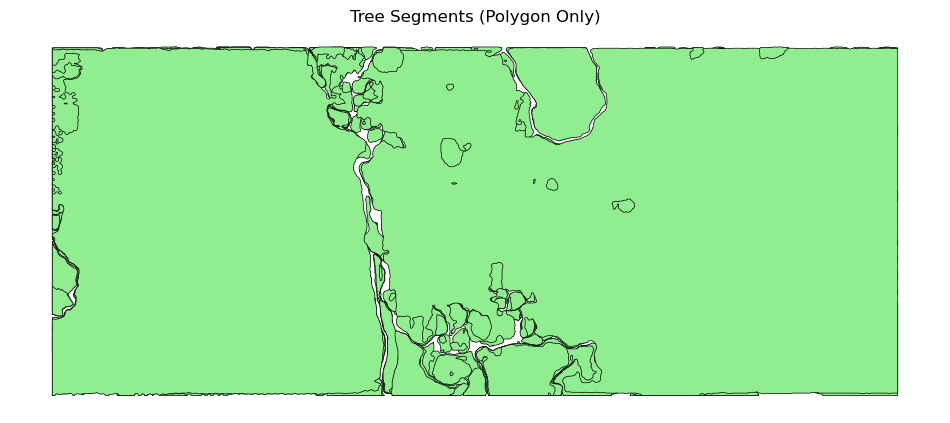

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load from file or reuse gdf
gdf = gpd.read_file("segmented_trees.geojson")

# Plot polygons only (no image)
gdf.plot(figsize=(12, 12), edgecolor="black", facecolor="lightgreen", linewidth=0.5)
plt.title("Tree Segments (Polygon Only)")
plt.axis("off")
plt.show()


In [1]:
pip install sentinelhub

  Obtaining dependency information for sentinelhub from https://files.pythonhosted.org/packages/91/0c/c092d9f8ecfff2cf5fd003adc487eb4bd7244cc15146d5b925be9d8c52e4/sentinelhub-3.11.1-py3-none-any.whl.metadata
  Obtaining dependency information for aenum>=2.1.4 from https://files.pythonhosted.org/packages/d0/fa/ca0c66b388624ba9dbbf35aab3a9f326bfdf5e56a7237fe8f1b600da6864/aenum-3.1.15-py3-none-any.whl.metadata
  Obtaining dependency information for dataclasses-json from https://files.pythonhosted.org/packages/c3/be/d0d44e092656fe7a06b55e6103cbce807cdbdee17884a5367c68c9860853/dataclasses_json-0.6.7-py3-none-any.whl.metadata
  Obtaining dependency information for oauthlib from https://files.pythonhosted.org/packages/7e/80/cab10959dc1faead58dc8384a781dfbf93cb4d33d50988f7a69f1b7c9bbe/oauthlib-3.2.2-py3-none-any.whl.metadata
  Obtaining dependency information for requests-oauthlib>=1.0.0 from https://files.pythonhosted.org/packages/3b/5d/63d4ae3b9daea098d5d6f5da83984853c1bbacd5dc826764b249fe11

In [3]:
import folium

lat, lon = -0.86965, 110.32836

m = folium.Map(
    location=[lat, lon],
    zoom_start=18,
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri",
)

folium.Marker([lat, lon], popup="Tembawang").add_to(m)
m


In [18]:
folium.Map(
    location=[lat, lon],
    zoom_start=19,
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google"
)


In [8]:
import folium

lat, lon = -0.86965, 110.32836

m = folium.Map(
    location=[lat, lon],
    zoom_start=19,
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google Satellite"
)

m.save("google_map.html")


In [11]:
from selenium import webdriver
import time
import os

options = webdriver.ChromeOptions()
options.add_argument("--headless")
driver = webdriver.Chrome(options=options)

driver.set_window_size(1024, 768)
driver.get("file://" + os.path.abspath("google_map.html"))
time.sleep(3)  # wait for tiles to load

driver.save_screenshot("google_satellite.png")
driver.quit()


In [20]:
min_lat = -0.872
max_lat = -0.867
min_lon = 110.326
max_lon = 110.331


In [2]:
from PIL import Image
import rasterio
from rasterio.transform import from_bounds
import numpy as np

# Load image and get shape
img = Image.open("google_satellite.png")
width, height = img.size

# Define the bounding box of the image in lat/lon
min_lon, max_lon = 110.326, 110.331
min_lat, max_lat = -0.872, -0.867

# Define affine transform (maps pixel to coordinates)
transform = from_bounds(min_lon, min_lat, max_lon, max_lat, width, height)

# Save as GeoTIFF
with rasterio.open(
    "google_satellite.tif",
    "w",
    driver="GTiff",
    height=height,
    width=width,
    count=3,
    dtype=rasterio.uint8,
    crs="EPSG:4326",
    transform=transform,
) as dst:
    r, g, b = img.split()
    dst.write(np.array(r), 1)
    dst.write(np.array(g), 2)
    dst.write(np.array(b), 3)


In [39]:
import folium
import geopandas as gpd
from folium.raster_layers import ImageOverlay
from rasterio.plot import reshape_as_image
import rasterio
import numpy as np

def show_geotiff_with_geojson(tif_path, geojson_path, tile_type="Esri"):
    # Load segmentation polygons
    gdf = gpd.read_file(geojson_path)

    # Load the .tif image and geospatial extent
    with rasterio.open(tif_path) as src:
        img = reshape_as_image(src.read())  # shape: (height, width, 3)
        bounds = src.bounds  # (minx, miny, maxx, maxy)

    # Convert bounds to (SW, NE) for folium
    image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]

    # Initialize folium map at center of image
    center_lat = (bounds.top + bounds.bottom) / 2
    center_lon = (bounds.left + bounds.right) / 2

    tiles_dict = {
        "Esri": "https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
        "Google": "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}"
    }

    m = folium.Map(location=[center_lat, center_lon], zoom_start=18,
                   tiles=tiles_dict[tile_type], attr=tile_type)

    # Add the .tif image as an overlay
    img_overlay = ImageOverlay(
        image=np.array(img),
        bounds=image_bounds,
        opacity=0.7,
        interactive=True,
        cross_origin=False,
        name="Satellite GeoTIFF"
    )
    img_overlay.add_to(m)

    # Add segmentation polygons
    folium.GeoJson(geojson_path, name="Segmented Trees").add_to(m)

    folium.LayerControl().add_to(m)

    output_file = "segmentation_map.html"
    m.save(output_file)
    print(f"✅ Map saved as: {output_file}")

# Example usage:
show_geotiff_with_geojson("google_satellite.tif", "segmented_trees.geojson")


✅ Map saved as: segmentation_map.html


In [2]:
import cv2

image = cv2.imread("google_satellite.tif")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# your existing SAM code here


In [3]:
import rasterio
import numpy as np

with rasterio.open("google_satellite.tif") as src:
    tif_img = np.moveaxis(src.read([1, 2, 3]), 0, -1).astype(np.uint8)
    transform = src.transform
    crs = src.crs


In [5]:
import os
import time
import cv2
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from PIL import Image
import rasterio
from rasterio.transform import from_bounds, xy
from rasterio.plot import reshape_as_image

import folium
from folium.raster_layers import ImageOverlay
from selenium import webdriver
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

# ------------------------
# 1. PARAMETERS
# ------------------------
lat, lon = -0.86965, 110.32836
zoom = 19
map_width, map_height = 1024, 1024
tif_path = "google_satellite.tif"
geojson_path = "segmented_trees.geojson"
html_map_path = "segmentation_map.html"
delta = 0.002  # bounding box delta in degrees

# ------------------------
# 2. GENERATE SATELLITE MAP
# ------------------------
m = folium.Map(
    location=[lat, lon],
    zoom_start=zoom,
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google Satellite"
)
m.save("temp_map.html")

options = webdriver.ChromeOptions()
options.add_argument("--headless")
options.add_argument(f"--window-size={map_width},{map_height}")
driver = webdriver.Chrome(options=options)
driver.get("file://" + os.path.abspath("temp_map.html"))
time.sleep(4)
driver.save_screenshot("temp_map.png")
driver.quit()

# Crop away Folium UI padding (optional: adjust if needed)
img = Image.open("temp_map.png").crop((0, 90, map_width, map_height))  # remove top navbar
img.save("google_satellite.png")
width, height = img.size

# ------------------------
# 3. SAVE AS GeoTIFF
# ------------------------
min_lon, max_lon = lon - delta, lon + delta
min_lat, max_lat = lat - delta, lat + delta
transform = from_bounds(min_lon, min_lat, max_lon, max_lat, width, height)

with rasterio.open(
    tif_path,
    "w",
    driver="GTiff",
    height=height,
    width=width,
    count=3,
    dtype="uint8",
    crs="EPSG:4326",
    transform=transform
) as dst:
    r, g, b = img.split()
    dst.write(np.array(r), 1)
    dst.write(np.array(g), 2)
    dst.write(np.array(b), 3)

# ------------------------
# 4. RUN SAM ON GeoTIFF
# ------------------------
with rasterio.open(tif_path) as src:
    image = np.moveaxis(src.read([1, 2, 3]), 0, -1).astype(np.uint8)
    transform = src.transform
    crs = src.crs

sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to("cpu")

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.85,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=20
)
masks = mask_generator.generate(tif_img)

# ------------------------
# 5. CONVERT MASKS TO GEOJSON
# ------------------------
def pixel_to_latlon(x, y, transform):
    lon, lat = xy(transform, y, x)
    return lon, lat

geo_polygons = []
for m in masks:
    mask = m["segmentation"].astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        if len(contour) >= 3:
            coords = [pixel_to_latlon(pt[0][0], pt[0][1], transform) for pt in contour]
            poly = Polygon(coords)
            if poly.is_valid and poly.area > 0:
                geo_polygons.append(poly)

gdf = gpd.GeoDataFrame(geometry=geo_polygons, crs=crs).to_crs("EPSG:4326")
gdf.to_file(geojson_path, driver="GeoJSON")

# ------------------------
# 6. OVERLAY ON INTERACTIVE MAP
# ------------------------
with rasterio.open(tif_path) as src:
    img = reshape_as_image(src.read())
    bounds = src.bounds

image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]
center_lat = (bounds.top + bounds.bottom) / 2
center_lon = (bounds.left + bounds.right) / 2

tiles_dict = {
    "Esri": "https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    "Google": "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}"
}

map_out = folium.Map(location=[center_lat, center_lon], zoom_start=18,
                     tiles=tiles_dict["Google"], attr="Google Satellite")

ImageOverlay(
    image=np.array(img),
    bounds=image_bounds,
    opacity=0.6,
    name="GeoTIFF Overlay"
).add_to(map_out)

folium.GeoJson(geojson_path, name="Segmented Trees").add_to(map_out)
folium.LayerControl().add_to(map_out)
map_out.save(html_map_path)

print(f"✅ All done! Open {html_map_path} to view your segmented trees overlay.")


✅ All done! Open segmentation_map.html to view your segmented trees overlay.


In [12]:
import os
import time
import cv2
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from PIL import Image
import rasterio
from rasterio.transform import from_bounds, xy
from rasterio.plot import reshape_as_image

import folium
from folium.raster_layers import ImageOverlay
from selenium import webdriver
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

# ------------------------
# 1. PARAMETERS
# ------------------------
lat, lon = -0.86965, 110.32836
zoom = 19
map_width, map_height = 1024, 1024
tif_path = "google_satellite.tif"
geojson_path = "segmented_trees.geojson"
html_map_path = "fine_segmentation_map.html"
delta = 0.010  # bounding box delta in degrees

# ------------------------
# 2. GENERATE SATELLITE MAP
# ------------------------
m = folium.Map(
    location=[lat, lon],
    zoom_start=zoom,
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google Satellite"
)
m.save("temp_map.html")

options = webdriver.ChromeOptions()
options.add_argument("--headless")
options.add_argument(f"--window-size={map_width},{map_height}")
driver = webdriver.Chrome(options=options)
driver.get("file://" + os.path.abspath("temp_map.html"))
time.sleep(4)
driver.save_screenshot("temp_map.png")
driver.quit()

# Crop away Folium UI padding (optional: adjust if needed)
img = Image.open("temp_map.png").crop((0, 90, map_width, map_height))  # remove top navbar
img.save("google_satellite.png")
width, height = img.size

# ------------------------
# 3. SAVE AS GeoTIFF
# ------------------------
min_lon, max_lon = lon - delta, lon + delta
min_lat, max_lat = lat - delta, lat + delta
transform = from_bounds(min_lon, min_lat, max_lon, max_lat, width, height)

with rasterio.open(
    tif_path,
    "w",
    driver="GTiff",
    height=height,
    width=width,
    count=3,
    dtype="uint8",
    crs="EPSG:4326",
    transform=transform
) as dst:
    r, g, b = img.split()
    dst.write(np.array(r), 1)
    dst.write(np.array(g), 2)
    dst.write(np.array(b), 3)

# ------------------------
# 4. RUN SAM ON GeoTIFF
# ------------------------
with rasterio.open(tif_path) as src:
    image = np.moveaxis(src.read([1, 2, 3]), 0, -1).astype(np.uint8)
    transform = src.transform
    crs = src.crs

sam = sam_model_registry["vit_h"](checkpoint="sam_vit_h.pth")
sam.to("cpu")

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=256,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.85,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=10
)
masks = mask_generator.generate(tif_img)

# ------------------------
# 5. CONVERT MASKS TO GEOJSON
# ------------------------
def pixel_to_latlon(x, y, transform):
    lon, lat = xy(transform, y, x)
    return lon, lat

geo_polygons = []
for m in masks:
    mask = m["segmentation"].astype(np.uint8)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
        if len(contour) >= 3:
            coords = [pixel_to_latlon(pt[0][0], pt[0][1], transform) for pt in contour]
            poly = Polygon(coords)
            if poly.is_valid and poly.area > 0:
                geo_polygons.append(poly)

gdf = gpd.GeoDataFrame(geometry=geo_polygons, crs=crs).to_crs("EPSG:4326")
gdf.to_file(geojson_path, driver="GeoJSON")

# ------------------------
# 6. OVERLAY ON INTERACTIVE MAP
# ------------------------
with rasterio.open(tif_path) as src:
    img = reshape_as_image(src.read())
    bounds = src.bounds

image_bounds = [[bounds.bottom, bounds.left], [bounds.top, bounds.right]]
center_lat = (bounds.top + bounds.bottom) / 2
center_lon = (bounds.left + bounds.right) / 2

tiles_dict = {
    "Esri": "https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    "Google": "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}"
}

map_out = folium.Map(location=[center_lat, center_lon], zoom_start=18,
                     tiles=tiles_dict["Google"], attr="Google Satellite")

ImageOverlay(
    image=np.array(img),
    bounds=image_bounds,
    opacity=0.6,
    name="GeoTIFF Overlay"
).add_to(map_out)

folium.GeoJson(geojson_path, name="Segmented Trees").add_to(map_out)
folium.LayerControl().add_to(map_out)
map_out.save(html_map_path)

print(f"✅ All done! Open {html_map_path} to view your segmented trees overlay.")


✅ All done! Open fine_segmentation_map.html to view your segmented trees overlay.
